In [1]:
# Install packages (if needed in Kaggle, usually preinstalled)
!pip install tqdm

import os
import pandas as pd
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.utils as vutils
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", DEVICE)

Using device: cuda


In [2]:
# Paths
CSVPATH = "/kaggle/input/celeba-dataset/list_attr_celeba.csv"
IMGDIR = "/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba"

ATTRS = ["Eyeglasses", "Smiling", "Mustache"]  
NUMATTRS = len(ATTRS)
IMGSIZE = 64

class CelebADataset(Dataset):
    def __init__(self, csvpath, imgdir, transform=None):
        self.df = pd.read_csv(csvpath)
        self.imgdir = imgdir
        self.transform = transform
        self.df.replace(-1, 0, inplace=True)
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        imgname = self.df.iloc[idx, 0]
        imgpath = os.path.join(self.imgdir, imgname)
        image = Image.open(imgpath).convert("RGB")
        w, h = image.size
        left, top = (w - 178) // 2, (h - 218) // 2
        image = image.crop((left, top, left+178, top+218))
        if self.transform: image = self.transform(image)
        attrs = self.df.iloc[idx][ATTRS].values.astype(np.float32)
        attrs = torch.from_numpy(attrs)
        return image, attrs

transform = transforms.Compose([
    transforms.Resize(IMGSIZE),
    transforms.CenterCrop(IMGSIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3),
])

dataset = CelebADataset(CSVPATH, IMGDIR, transform=transform)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True, num_workers=4, pin_memory=True, drop_last=True)

In [3]:
class CVAE(nn.Module):
    def __init__(self, latentdim=128, numattrs=3):
        super().__init__()
        c = 128
        self.latentdim = latentdim
        self.numattrs = numattrs
        self.enc = nn.Sequential(
            nn.Conv2d(3 + numattrs, c, 4, 2, 1), nn.LeakyReLU(0.2),
            nn.Conv2d(c, c*2, 4, 2, 1), nn.LeakyReLU(0.2),
            nn.Conv2d(c*2, c*4, 4, 2, 1), nn.LeakyReLU(0.2),
            nn.Conv2d(c*4, c*8, 4, 2, 1), nn.LeakyReLU(0.2),
        )
        self.fcmu = nn.Linear(c*8*4*4, latentdim)
        self.fclogvar = nn.Linear(c*8*4*4, latentdim)
        self.fcdec = nn.Linear(latentdim + numattrs, c*8*4*4)
        self.dec = nn.Sequential(
            nn.ConvTranspose2d(c*8, c*4, 4, 2, 1), nn.ReLU(),
            nn.ConvTranspose2d(c*4, c*2, 4, 2, 1), nn.ReLU(),
            nn.ConvTranspose2d(c*2, c, 4, 2, 1), nn.ReLU(),
            nn.ConvTranspose2d(c, 3, 4, 2, 1), nn.Tanh(),
        )
    def encode(self, x, c):
        c = c.view(-1, self.numattrs, 1, 1).repeat(1, 1, x.size(2), x.size(3))
        x_in = torch.cat([x, c], dim=1)
        h = self.enc(x_in).view(x.size(0), -1)
        mu = self.fcmu(h)
        logvar = self.fclogvar(h)
        return mu, logvar
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def decode(self, z, c):
        h = self.fcdec(torch.cat([z, c], dim=1)).view(-1, 1024, 4, 4)
        return self.dec(h)
    def forward(self, x, c):
        mu, logvar = self.encode(x, c)
        z = self.reparameterize(mu, logvar)
        return self.decode(z, c), mu, logvar

model = CVAE(latentdim=128, numattrs=NUMATTRS).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=5e-5)

In [4]:
def loss_function(recon, x, mu, logvar, beta=4.0):
    MSE = F.mse_loss(recon, x, reduction='sum') / x.size(0)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / x.size(0)
    return MSE + beta * KLD, MSE, KLD

In [5]:
NUMEPOCHS = 75
model.train()
for epoch in range(1, NUMEPOCHS + 1):
    totalloss = 0.0
    pbar = tqdm(dataloader, desc=f"Epoch {epoch}/{NUMEPOCHS}")
    for imgs, attrs in pbar:
        imgs, attrs = imgs.to(DEVICE), attrs.to(DEVICE)
        optimizer.zero_grad()
        recon, mu, logvar = model(imgs, attrs)
        loss, mse, kld = loss_function(recon, imgs, mu, logvar)
        loss.backward()
        optimizer.step()
        totalloss += loss.item()
        pbar.set_postfix({"loss": f"{loss.item():.2f}", "mse": f"{mse.item():.2f}", "kld": f"{kld.item():.2f}"})
    print(f"Epoch {epoch} Avg Loss: {totalloss / len(dataloader):.2f}")

Epoch 1/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 1 Avg Loss: 1113.42


Epoch 2/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 2 Avg Loss: 785.74


Epoch 3/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 3 Avg Loss: 753.74


Epoch 4/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 4 Avg Loss: 737.06


Epoch 5/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 5 Avg Loss: 724.59


Epoch 6/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 6 Avg Loss: 714.30


Epoch 7/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 7 Avg Loss: 707.54


Epoch 8/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 8 Avg Loss: 702.15


Epoch 9/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 9 Avg Loss: 697.78


Epoch 10/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 10 Avg Loss: 693.77


Epoch 11/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 11 Avg Loss: 690.90


Epoch 12/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 12 Avg Loss: 688.00


Epoch 13/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 13 Avg Loss: 685.59


Epoch 14/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 14 Avg Loss: 683.30


Epoch 15/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 15 Avg Loss: 681.21


Epoch 16/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 16 Avg Loss: 679.42


Epoch 17/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 17 Avg Loss: 677.67


Epoch 18/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 18 Avg Loss: 676.13


Epoch 19/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 19 Avg Loss: 674.65


Epoch 20/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 20 Avg Loss: 673.28


Epoch 21/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 21 Avg Loss: 671.92


Epoch 22/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 22 Avg Loss: 670.92


Epoch 23/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 23 Avg Loss: 669.69


Epoch 24/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 24 Avg Loss: 668.60


Epoch 25/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 25 Avg Loss: 667.79


Epoch 26/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 26 Avg Loss: 666.58


Epoch 27/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 27 Avg Loss: 665.74


Epoch 28/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 28 Avg Loss: 664.86


Epoch 29/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 29 Avg Loss: 663.92


Epoch 30/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 30 Avg Loss: 663.13


Epoch 31/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 31 Avg Loss: 662.49


Epoch 32/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 32 Avg Loss: 661.62


Epoch 33/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 33 Avg Loss: 660.93


Epoch 34/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 34 Avg Loss: 660.26


Epoch 35/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 35 Avg Loss: 659.50


Epoch 36/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 36 Avg Loss: 658.91


Epoch 37/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 37 Avg Loss: 658.30


Epoch 38/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 38 Avg Loss: 657.67


Epoch 39/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 39 Avg Loss: 657.39


Epoch 40/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 40 Avg Loss: 656.61


Epoch 41/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 41 Avg Loss: 656.00


Epoch 42/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 42 Avg Loss: 655.57


Epoch 43/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 43 Avg Loss: 655.09


Epoch 44/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 44 Avg Loss: 654.63


Epoch 45/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 45 Avg Loss: 654.10


Epoch 46/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 46 Avg Loss: 653.51


Epoch 47/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 47 Avg Loss: 653.17


Epoch 48/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 48 Avg Loss: 652.61


Epoch 49/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 49 Avg Loss: 652.28


Epoch 50/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 50 Avg Loss: 651.78


Epoch 51/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 51 Avg Loss: 651.36


Epoch 52/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 52 Avg Loss: 650.86


Epoch 53/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 53 Avg Loss: 650.57


Epoch 54/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 54 Avg Loss: 650.17


Epoch 55/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 55 Avg Loss: 649.83


Epoch 56/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 56 Avg Loss: 649.36


Epoch 57/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 57 Avg Loss: 649.12


Epoch 58/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 58 Avg Loss: 648.76


Epoch 59/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 59 Avg Loss: 648.35


Epoch 60/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 60 Avg Loss: 647.93


Epoch 61/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 61 Avg Loss: 647.53


Epoch 62/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 62 Avg Loss: 647.33


Epoch 63/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 63 Avg Loss: 646.93


Epoch 64/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 64 Avg Loss: 646.57


Epoch 65/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 65 Avg Loss: 646.29


Epoch 66/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 66 Avg Loss: 646.03


Epoch 67/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 67 Avg Loss: 645.69


Epoch 68/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 68 Avg Loss: 645.41


Epoch 69/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 69 Avg Loss: 645.11


Epoch 70/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 70 Avg Loss: 644.86


Epoch 71/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 71 Avg Loss: 644.51


Epoch 72/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 72 Avg Loss: 644.22


Epoch 73/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 73 Avg Loss: 644.01


Epoch 74/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 74 Avg Loss: 643.79


Epoch 75/75:   0%|          | 0/1582 [00:00<?, ?it/s]

Epoch 75 Avg Loss: 643.49


In [6]:
import os
os.makedirs("samples_64", exist_ok=True)

model.eval()
count = 0
with torch.no_grad():
    for imgs, attrs in dataloader:
        imgs, attrs = imgs.to(DEVICE), attrs.to(DEVICE)
        batch_size = imgs.size(0)
        fixed_noise = torch.randn(batch_size, 128).to(DEVICE)

        for j in range(batch_size):
            if count >= 64:
                break
            original_attr = attrs[j].unsqueeze(0)
            smile_attr = torch.zeros_like(original_attr)
            smile_attr[0, ATTRS.index("Smiling")] = 1.0

            mustache_attr = torch.zeros_like(original_attr)
            mustache_attr[0, ATTRS.index("Mustache")] = 1.0

            glasses_attr = torch.zeros_like(original_attr)
            glasses_attr[0, ATTRS.index("Eyeglasses")] = 1.0

            noise_vec = fixed_noise[j].unsqueeze(0)

            original_img = model.decode(noise_vec, original_attr)
            smiling_img = model.decode(noise_vec, smile_attr)
            mustache_img = model.decode(noise_vec, mustache_attr)
            glasses_img = model.decode(noise_vec, glasses_attr)

            combined = torch.cat([original_img, smiling_img, mustache_img, glasses_img], dim=3)

            vutils.save_image(combined, f"samples_64/sample_{count}.png", normalize=True, value_range=(-1, 1))

            count += 1
        if count >= 64:
            break

print("Saved Images")


Saved Images


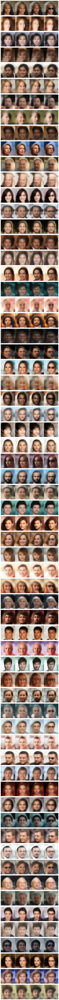

In [7]:
from PIL import Image
import matplotlib.pyplot as plt

folder = "samples_64"
n_images = 64

plt.figure(figsize=(8, n_images * 2))  

for i in range(n_images):
    img_path = f"{folder}/sample_{i}.png"
    img = Image.open(img_path)
    plt.subplot(n_images, 1, i + 1)  
    plt.imshow(img)
    plt.axis('off')

plt.tight_layout()
plt.show()